# Image Colorization using DCNN

- **Data Directory: *data_oxford***
- **Output Pictures (Samples): *output_pictures***
- **Saved Model Data: *model_data***
- **The model data directory inlcudes only the average loss of the testing phase along with the predictions made.**

**The goal of this repository is to build and encoder decoder architecture using Deep Convolutional neural network to colroize gray scale images. Furthermore, this motebook includes architectural improvements and changes to some of the components of the encoder decoder to seek further improvements.**

**Assignment Outline:**
<ol>
  <li><b>Ncessary Imports: This section imports all necessary libraries. The kornia library was used to convert LAP images to RGB images. It was preferred over Open Cv for this task, as it automatically uses the GPU.</b></li>
  <li><b>Necessay Functions: This section entails some general functions repeatedly used over the whole notebook.</b></li>
  <li><b>Data Preprocessing: This sections loads the chosen dataset and splits it into training (80%) and testing (20%) splits.</b></li>
  <li><b>Encoder-Decoder Implementation: Includes all the encoder decoder implementation including the base model, and all the code for the additional features such as perceptual loss, pretrained global feature extractor, and model improvement.</b></li>
  <li><b>All of the following sections include training, testing, model exporting and loading, evaluation, and visualization of some samples: "Encoder Decoder Baseline - Application", "Architecture Imrovement", and "Perceptual Loss"</b></li>
  <li><b>PatchGAN Discriminator: Includes the customized training function for PatchGAN Discriminator where it turns the Encoder Decoder as a generator and adds the PatchGAN as a discriminator.</b></li>
  <li><b>References: links of the articles, videos, or papers used to complete this assignment.</b></li>
</ol>

**Hardware Used: Google Collab Pro with A100 Graphics card was used. However, the L4 GPU is adequate to run the code of this assignment. The L4 GPU comes with approximately 24GB VRAM. On the other hand, the A100 GPU comes with approximately 80GB VRAM. While the latter used about 7 computer units per hour, it was perferred thanks to its speed.**

- **Library Versions:**
  - **Numpy Version: 2.0.2**
  - **Matplotlib Version: 3.10.0**
  - **Torch Version: 2.9.0+cu126**
  - **Sickit-Image Version: 0.25.2**
  - **Kornia Version: 0.8.2**
  
- **Dataset Link: https://www.kaggle.com/datasets/waseemalastal/the-oxford-flowers-102-dataset**
- **Driver Link: https://drive.google.com/drive/folders/1NBw93UxCx2nCI65ZTF1ByUW4OMuOTb8C?usp=sharing**
- **Video Link:**
<br />

**Thank you for extending the deadline.**

## Necessary Imports

In [ ]:
pip install kornia

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 86.5 MB/s eta 0:00:00


In [ ]:
"""
Definition of the some necessary libraries and modules.

torch:
  an open-source deep learning framework that was used to build the CNN architecture
  for the Encoder Decoder, Global Feature Extractor, and PatchGAN Discriminator.

torchvision.models:
  Pytorch module that provide ready pre-trained deep learning models.
  It was used to create the EfficientNetB0 global feature extractor.

TensorDataset & DataLoader:
  To structure the splitted data into Pytorch-Compatible
  datasets and load data in batches during training.

kornia:
  Similar to open cv but it uses the GPU instead of the CPU.
  It was used here to convert LAB images to the RGB space.

skimage:
  Short for sickit-image is a library used for image processing.
  It was used here to compute the SSIM score.

tqdm:
  To visualize the progress in a for loop.

"""
import os

import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import cv2
import kornia as K

import torch
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

import skimage
from skimage.metrics import structural_similarity as sk_ssim

import pickle

import time

In [ ]:
print(f"Numpy Version: {np.__version__}")
print(f"Matplotlib Version: {plt.matplotlib.__version__}")
print(f"Torch Version: {torch.__version__}")
print(f"Sickit-Image Version: {skimage.__version__}")
print(f"Kornia Version: {K.__version__}")

Numpy Version: 2.0.2
Matplotlib Version: 3.10.0
Torch Version: 2.9.0+cu126
Sickit-Image Version: 0.25.2
Kornia Version: 0.8.2


In [ ]:
# Use the GPU for CNN training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device²:", device)

Using device²: cpu


## Necessary Functions

In [ ]:
def lab_to_rgb(L, ab):
  """
  Converts an image from LAB color space to RGB color space.


  Parameters
  ---------
  L: np.ndarray OR torch.Tensor
    The L channel of the LAB image.
    They shape should be (Batch, Channel(1), Height, Width)

  ab: np.ndarray OR torch.Tensor
    The ab channel of the LAB image.
    They shape should be (Batch, Channel(2), Height, Width)


  Returns
  -------
  rgb: torch.Tensor
    The RGB image.
    The shape should be (Batch, Channel(3), Height, Width)
  """

  if isinstance(L, np.ndarray): # Make sure they are torch
      L = torch.from_numpy(L)
  if isinstance(ab, np.ndarray):
      ab = torch.from_numpy(ab)

  if L.dim() == 3: # in case there is only one sample
      L = L.unsqueeze(0)   # (1, 1, H, W)
  if ab.dim() == 3:
      ab = ab.unsqueeze(0) # (1, 2, H, W)

  L = L.to(device)
  ab = ab.to(device)

  L_unormalized = L * 100.0
  ab_unormalized = ab * 128.0
  lab = torch.cat([L_unormalized, ab_unormalized], dim=1)
  rgb = K.color.lab_to_rgb(lab)

  return rgb.clamp(0,1)


def show_images(X, y, n_cols = 4, figsize=(10,5)):

  n_cols = n_cols
  n_rows = int(np.ceil(X.shape[0] / n_cols))
  fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
  axes = axes.flatten()
  for i in range(n_rows):
      for j in range(n_cols):
          index = i * n_cols + j
          if index >= X.shape[0] or index >= y.shape[0]:
            break
          L = X[index]
          if L.ndim == 2:
            L = L[None, :, :] # C, H, W
          ab = y[index]
          if ab.shape[0] != 2:
            ab = ab.transpose(2,0,1) # C, H, W

          img = lab_to_rgb(L, ab)

          img = img[0].permute(1,2,0).cpu().numpy()
          axes[index].imshow(img) # Expects (H, W, C) not (C, H, W)
          axes[index].axis("off")
  if(X.shape[0] % n_cols != 0): #To remove unused subplots
    for i in range(n_cols * n_rows):
      if i >= X.shape[0]:
        fig.delaxes(axes[i])
  print(f"The shape of all images are :{X[0].shape}")

def show_l_pred_real(arr_1, arr_2, arr_3, save_path, save=True):
  """
  Visualizes  grayscale (L), the predicted ab, and the real ab
  next to each other as shown in Figure 1 in the PDF.
  This functon also saves the figure to the specified path.

  Parameters
  ----------
  arr_1: list of np.ndarray OR torch.Tensor
    A list of the L grayscale images

  arr_2: list of np.ndarray OR torch.Tensor
    A list of the predicted ab images

  arr_3: list of np.ndarray OR torch.Tensor
    A list of the real ab images

  save_path: str
    The path to save the figure.

  save: bool
    Whether to save the whole figure or not.


  """
  n_cols = 3
  n_rows = arr_1.shape[0]
  fig, axes = plt.subplots(n_rows, n_cols, figsize=(12,12))
  axes = axes.flatten()
  titles = ["Colorized Input", "Colorized Output", "Original Color Image"]

  for i in range(n_rows):
    # output the three pictures
    L = arr_1[i]
    ab_pred = arr_2[i]
    ab_real = arr_3[i]
    img_pred = lab_to_rgb(L, ab_pred)[0].permute(1,2,0).cpu().numpy() # (H, W, C)
    img_real = lab_to_rgb(L, ab_real)[0].permute(1,2,0).cpu().numpy() # (H, W, C)
    L = (L * 255).cpu().numpy().astype(np.uint8).squeeze(0)
    L = cv2.cvtColor(L, cv2.COLOR_GRAY2RGB)
    all = [L, img_pred, img_real]

    for j in range(n_cols):
      index = i * n_cols + j
      ax = axes[index]
      ax.imshow(all[j])

      ax.axis("off")
      ax.set_title(titles[j])

  fig.tight_layout(pad=0.5)
  if save:
    plt.savefig(save_path, dpi=300)
  plt.show()

def clean_gpu():
  # GPU memory cleanup
  import gc
  gc.collect()
  if torch.cuda.is_available():
      torch.cuda.empty_cache()


## Data Preprocessing

### Data Overview

- **In this assignment the oxford flowers dataset, created by the Visual Geometry Group at the University of Oxford, was chosen over other ones. This dataset is a high-quality dataset containing photographs that have subtle categories which reinforces the colorizer model later on. It was primarily chosen due to its simplicity and consistent visual environment. As a result, this can offer better results. A more complicated dataset with different environments needs higher computational power and more time to run it over a lot of epochs.**
- **Originally, this dataset is provided as pictures. They are uploaded to the google drive. However, for efficiency purposes, I downloaded the data on my local device and saved it as numpy based data. Not a single change was applied to the pictures. The numpy files are also uploaded to the Google Drive in the folder under the name *data_oxford***

**Link: https://www.kaggle.com/datasets/waseemalastal/the-oxford-flowers-102-dataset**

### Data Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dir_path = "drive/MyDrive/AIN 433 - Computer Vision Lab - Assignment 3/"
output_path = dir_path + "output_pictures/"
model_path = dir_path + "model_data/"
data_path = dir_path + "data_oxford/"

print(os.listdir(data_path))

['L_grayscale.npy.npz', 'ab.npy.npz', 'images']


In [ ]:
# Load the L grayscale pictures
with np.load(data_path + "/L_grayscale.npy.npz") as data:
    X = data["arr_0"]

In [ ]:
# Load th
with np.load(data_path + "/ab.npy.npz") as data:
    y = data["arr_0"]

In [ ]:
print(f"There are {X.shape[0]} images in the dataset")

### Data Split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

In [ ]:
# Convert them to pytorch tensord to feed them to the pytorch based CNN models
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)

In [ ]:
X_train.shape

torch.Size([6551, 1, 256, 256])

In [ ]:
y_train.shape

torch.Size([6551, 2, 256, 256])

The shape of all images are :torch.Size([1, 256, 256])


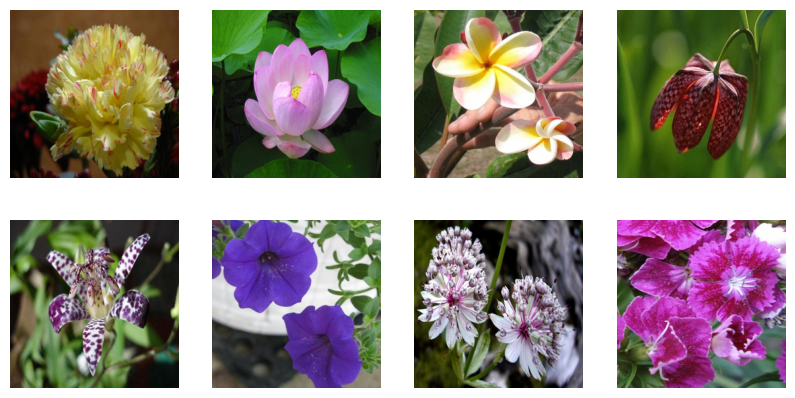

In [ ]:
# Example Images
show_images(X_test[20:28], y_test[20:28])

## Encoder-Decoder Implementation

**Encoder Decoder Definiton:**
- **CNN**
  - **A CNN is a deep learning architecture that involves automatic meaningful feature extraction. CNN uses convolutional layers to detect local spatial such as edges, textures, and shapes. As the input passes through successive convolutional layers, the complexity increases identifiying greater patterns of the given sample image. The output of a convolutional layer is called a feature map. The formula is:**
  $$Z(x,y) = (f * g)(x, y) + b = \sum_{i=0}^{k-1} \sum_{j=0}^{k-1} f(x+i,\, y+j) \cdot g(i, j) + b$$
  - **Where**
    - **k: kernel size**
    - **g: kernel function**
    - **f: image**

    **The kernel size of the filters was chosen to be $3$ as a higher filter size dramatically shrinks the input too fast. The output size formula:**
$$\text{output_size} = \frac{W - k + 2\times P}{S} + 1$$
    
  - **Where:**
    - **W: image size**
    - **k: kernel size**
    - **P: padding value**
    - **S: stride**

  - **Afterwards, an activation function is applied to the feature map for nonlinear representation of the image to make the model non-linear and learn complex patterns. These complex patterns are not programmed but gradually learnt in back propagation (BP). Obviously, the values of the kernel at first will be meaningless and the difference between the predicted image will be high than the actual one creating a high error. Thourgh BP, the error bounces back to the filter value and altering them using Gradient Descent.**

- **Encoder**
  - **Building upon this fundamental structure, the Encoder-Decoder architecture relies on these convolutional layers for image colorization to extract low-level features, mid-level features, and global-level features from the L image. Low-level features are part of the early stages of the encoder phase. This stage is responsible for extracting fundamental features such as edges, corners, and textures. A sum of 6 convolutional layers achieves the low-level feature extraction.**
  - **Simulatenously, Following this, 2 convolutional layers are employed for the mid-level feature extraction that focuses on learning more abstract representations such as object parts and regional textures like the repeated textures in the flowers. the global features are extracted from the original grayscale flower image. This stage provides an overall understanding of flower images not just its looks pixel by pixel, but it offers the semantic context. For instance, understanding the shape of a leaf offers the correct colors to that leaf instead of offering colors that pertain to the flower itself.**
- **Fusion**
  - **As described in the base encoder decoder architecture in the assignment pdf, the fusion is the stage where the network combines the low-mid level features and global level features. Indeed, these two of information are complimentary: low-mid level tells us where those structures are while the global level tells us what those structures are. As a result, the global level feature is expanded to match the width and height of the low-mid level output.**
- **Decoder**
  - **After the identification and detection of the features, the decoder is responsible for reconstructing the original resolution of the image to compute the predicted chrominance components (a,b) from the fused output. During this stage, the feature maps are progressively upsampled to reach the original size and the number of channels decreased to reach the number 2 representing the (a, b) components. In fact, the a b components are partially reached when the image gets upsampled up to the half of the original spatial sizes and then upsampled again to match the full size. Combining the L grayscale with the ab image renders the LAB image to convert back to the RGB space.**

  **L1 loss was used as loss function. It can be mathematically described as: $$L1 = \frac{1}{N} \sum_{i=1}^{N} |Y_i - \hat{Y}_i|$$** where $N$ is the total number of values.

### PatchGAN Discriminator Implementation

In [ ]:
class patchGAN(nn.Module):
  """
  Class based implementation of the PatchGAN discriminator

  It is worth mentioning that Generative Adversarial Network is
  a very interesting architecture.

  The original encoder-decoder colorizer generates the colored image.
  In the patchGAN context, this is known as the generator.
  patchGAN is a set of convolutional networks that receives an RGB-based
  image of shape (3, H, W) and outputs a feature map of shape (1, N, N).
  Each value of the feature map represents how real a local image patch
  is. This module, known as the discriminator, tried to classify if these
  small patches looks realistic or not rather than judging the whole image
  with a single scalar.

  The generator should generate better AP images to fool the patchGAN module
  and the latter should better classify the patches. A kind of adversarial
  game.


  Parameters
  ----------
  in_channels: int, default 3
    Number of inputs channels
    It is 3 since an RGB image is the input.


  Attributes
  ----------
  model: nn.Sequential
    The sequential model of the patchGAN discriminator.

  """
  def __init__(self, in_channels=3):
    super(patchGAN, self).__init__()

    self.model = nn.Sequential(
        nn.Conv2d(in_channels=in_channels, out_channels=64, kernel_size=4, stride=2, padding=1),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=1, padding=1),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=1)
    )

  def forward(self, X):
    """
    Forward propagation of the patchGAN discriminator.

    Parameters
    ----------
    X: torch.Tensor
      Input image tensor of shape (B, 3, H, W)


    Returns
    -------
    torch.Tensor:
      Feature map of shape (B, 1, N, N)

      Each value in the output represents how realistic the corresponding
      image patch is.
    """
    return self.model(X)

### Global Extractor Implementation

In [ ]:
class GlobalExtractor(nn.Module):
  """
  Global feature extractor class used to derive the semantic context
  of the grayscale flower image.

  This class incldues two type of global feature extractors
    - EfficientNetB0: a family of pretrained CNNs that extracts
    global features well with low computational resources.
    - yahyaGlobal: a custome global extractor built from scratch inspired from [4].
    It consists of strided and un-strided convolutional layers that process the L flower
    image to gradually downspample the spatial resolution and extract the semantic context
    of the input image. The stride logic is the same as the one implemented in the local-mid
    feature extractor. Then, the final feature map is applied to average pooling to collapse
    the 4D dimension into 2D through averaging each feature map for each channel.
    From (B, C, H, W) -> (B, C). This is makes the module invariant to spatial resolution.
    The final result is flattened and fed to two fully connected layers to have the final 1D vector (for 1 batch).
    Two FC layers were used instead of one to make the global features more expressive and includes
    a non-linear transformation.


  Parameters
  ----------
  width : int
      Width of the input image.

  mode : str
      Type of global feature extractor.

  act_f : str
      Activation function type ("relu", "sigmoid", or "tanh").

  global_D : int
      Dimensionality of the global feature vector.


  Attributes
  ----------
  global_extractor: nn.Module
    The global feature extractor. It can be yahyaGlobal or EfficientNetB0.

  head: nn.Sequential
    The FC layers of the global feature extractor.
  """
  def __init__(self, width, mode, act_f, global_D):
    super(GlobalExtractor, self).__init__()
    self.mode = mode
    self.act_f = act_f
    #global level feature extraction CNN preparation
    if self.mode == "EfficientNetB0": # Baseline model used here
      model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
      self.global_extractor = model.features

      # Original efficentnetb0 expects 3 Channels not 1 like here
      # As a result, the first convolution layer will be changed to accept
      # 1 channel only. The parameters will be copied since it is a pretrained model.
      first_conv = self.global_extractor[0][0]
      original_out_channels = first_conv.out_channels
      original_kernel_size = first_conv.kernel_size
      original_stride = first_conv.stride
      original_padding = first_conv.padding
      new_conv = nn.Conv2d(
          in_channels=1,
          out_channels=original_out_channels,
          kernel_size=original_kernel_size,
          stride=original_stride,
          padding=original_padding
          )

      with torch.no_grad():
        new_conv.weight.copy_(first_conv.weight.sum(dim=1, keepdim=True) / first_conv.in_channels) # Average of the RGB weights

      self.global_extractor[0][0] = new_conv
      feature_dim = 1280 # output feature depth is always 1280

    else:
      # final_feature_map_width = int(width / 4)
      self.global_extractor = nn.Sequential(

          # CONV1
          nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=2, padding=1),
          nn.BatchNorm2d(64),
          self.act_f,
          # CONV2
          nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(128),
          self.act_f,

          # CONV3
          nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
          nn.BatchNorm2d(256),
          self.act_f,

          #CON4
          nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1),
          nn.BatchNorm2d(512),
          self.act_f,
      )
      feature_dim = 512

    self.head = nn.Sequential(
          nn.AdaptiveAvgPool2d((1, 1)), #
          nn.Flatten(),
          nn.Linear(feature_dim, 1024),
          self.act_f,
          nn.Linear(1024, global_D)
      )


  def forward(self, X):
    """
    The forward pass of the global feature extractor.

    Parameters
    ----------
    X: torch.Tensor
      L grayscale input image of shape (B, C, H, W)

    Returns
    -------
    torch.Tensor
      Global feature embedding of shape (B, global_D)
    """
    X = self.global_extractor(X)
    return self.head(X)

### Encoder Decoder Implementation

- **The ReLU was chosen for activating the feature maps as it enables fast convergence and mitigate the problem of the vanishing gradient problem that is found in the Sigmoid and Tanh activation function.**

In [ ]:
class EncoderDecoder(nn.Module):
  """


  Parameters
  ----------
  act_f : str
      Activation function type ("relu", "sigmoid", or "tanh").

  input_shape : tuple
      Shape of the input image (C, H, W).

  global_mode : str
      Type of global feature extractor. It takes
      two possible values: "EfficientNetB0" or "yahyaGlobal".

  global_D : int
      Dimensionality of the global feature vector.

  skip_connections : bool default False
      Whether to use skip connections from the encoder.



  Attributes
  ----------
  convs: list of nn.Sequential
    A list of the convolutional layers of the encoder

  training_loss: list of float
    Stores the L1 training loss

  testing_loss: list of float
    Stores the L1 testing loss

  skip_indices: list of int
    Indices of the skip connections in the encoder

  global_extractor: nn.Module
    The global feature extractor. It can be
    yahyaGlobal or EfficientNetB0.

  output_channels: list of int
    The number of output channels for each convolutional layer.

  self.decoder1: nn.Sequential
    The first decoder layer. It entails 2 Convolutional layer
    where each one is followed by normalization and the activation
    function.

  self.decoder2: nn.Sequential
    The second decoder layer.

  self.decoder3: nn.Sequential
    The third decoder layer.



  """
  def __init__(self, act_f, input_shape, global_mode, global_D, skip_connections = False):
    super(EncoderDecoder, self).__init__()

    self.convs = nn.ModuleList()
    self.training_loss = []
    self.testing_loss = []
    self.skip_connections = skip_connections

    # Activation Function Selection
    if act_f == "sigmoid":
      self.act_f = nn.Sigmoid()
    elif act_f == "relu":
      self.act_f = nn.ReLU(inplace=True)
    elif act_f == "tanh":
      self.act_f = nn.Tanh()

    # low-mid level feature extraction convolutional layer preparation
    input_channel = input_shape[0] # Should be 1 for the L grayscale input flower images
    self.output_channels  = [64, 128, 128, 256, 256, 512, 512, 256] # first 6: low level, last two: mid level
    strides = [2,1,2,1,2,1,1,1] # To downsample the images

    # Build the convolutional layers of the encoder
    for i, out_channel in enumerate(self.output_channels):

      self.convs.append(nn.Sequential(
          nn.Conv2d(
            in_channels=input_channel,
            out_channels=out_channel,
            kernel_size=3,
            stride = strides[i],
            padding=1
          ),
          nn.BatchNorm2d(out_channel),
          self.act_f
      ))

      input_channel = out_channel

    self.skip_indices = [0,2] if self.skip_connections else []
    self.global_extractor = GlobalExtractor(input_shape[2], global_mode, self.act_f, global_D)


    # Decoder
    decoder_1_in_channels = self.output_channels[-1] + global_D
    self.decoder1 = nn.Sequential(
        nn.Conv2d(in_channels = decoder_1_in_channels, out_channels=256, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(256),
        self.act_f,
        nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(128),
        self.act_f,
        nn.Upsample(scale_factor=2, mode='nearest'), # here the feature map became 64x64
    )

    decoder2_in_channels = 128 + self.output_channels[self.skip_indices[1]] if self.skip_connections else 128

    self.decoder2 = nn.Sequential(
        nn.Conv2d(in_channels=decoder2_in_channels, out_channels=64, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(64),
        self.act_f,
        nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(64),
        self.act_f,
        nn.Upsample(scale_factor=2, mode='nearest'), # here the feature map became 128x128
    )

    decoder3_in_channels = 64 + self.output_channels[self.skip_indices[0]] if self.skip_connections else 64
    self.decoder3 = nn.Sequential(
        nn.Conv2d(in_channels=decoder3_in_channels, out_channels=32, kernel_size=3, stride=1, padding=1),
        nn.BatchNorm2d(32),
        self.act_f,
        nn.Conv2d(in_channels=32, out_channels=2, kernel_size=3, stride=1, padding=1),

        nn.Tanh(), # To make sure the values are in the range of [-1,1]
        nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True) # here the feature map became 256 x256
    )

  def forward(self, X):
    """
    Forward pass of the Encoder-Decoder colorization network.

    Parameters
    ----------
    X: torch.Tensor
      Input image tensor of shape (batch_size, 1, H, W).

    Returns
    -------
    torch.Tensor
      Colorized ab image tensor of shape (batch_size, 2, H, W).
    """

    # Encoding
    # Low level feature extraction
    skips = {}
    low_mid_level = X

    for i,conv in enumerate(self.convs):
      low_mid_level = conv(low_mid_level)
      if i in self.skip_indices:
        skips[i] = low_mid_level

    # Global Feature Extraction
    global_level = self.global_extractor(X)

    # Fusion
    h_low_mid = low_mid_level.shape[2]
    w_low_mid = low_mid_level.shape[3]
    global_level = global_level.view(-1, global_level.shape[1], 1, 1)
    global_level = global_level.expand(-1, -1, h_low_mid, w_low_mid) # Changed from repeat to expand
    fused = torch.cat((low_mid_level, global_level), dim=1)

    # Decoding
    decoded = self.decoder1(fused)
    if(self.skip_connections):
      decoded = torch.cat((decoded, skips[2]), dim=1)

    decoded = self.decoder2(decoded)
    if(self.skip_connections):
      decoded = torch.cat((decoded, skips[0]), dim=1)

    decoded = self.decoder3(decoded)

    return decoded

### Perceptual Loss Implementation

- **The perceptual loss computes the difference between the final RGB based predicted and actual flower images encouraing more realistic colors and textures rather than local pixel-wise loss estimation using $L_1$. It checks if two flower pictures look similar in terms of structure, texture, and appearance.
$$\mathcal{L}_{\text{perc}}
=  L_1(\phi(I_{\text{pred}}) - \phi(I_{\text{ac}}))$$

Where:
- $I_{\text{pred}}$ is the predicted image.
- $I_{\text{ac}}$ is the actual image.
- $\phi()$ denotes the feature map extracted from the VGG16 pretrained neural network.
- $L_1$ is the L1 loss function.

In [ ]:
# Installation + preparation of the VGG16 pretrained model
vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
vgg16_features = vgg16.features[:21].eval()
vgg16_features.to(device)
for parameter in vgg16_features.parameters():
  parameter.requires_grad = False

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:02<00:00, 242MB/s]


In [ ]:
def perceptualLoss(pred, actual, X):
  """
  Computes the perceptual loss between the predicted and actual images.

  Parameters
  ----------
  pred : torch.Tensor
    Predicted image tensor of shape (batch_size, 2, H, W).

  actual : torch.Tensor
    Actual image tensor of shape (batch_size, 2, H, W).

  X : torch.Tensor
    Grayscale image tensor of shape (batch_size, 1, H, W).
  """
  # Convert them to RGB
  pred_rgb = lab_to_rgb(X, pred)
  actual_rgb = lab_to_rgb(X, actual)

  # Calculate pred_feature_map outside no_grad to allow gradient tracking
  pred_feature_map = vgg16_features(pred_rgb)

  with torch.no_grad():
    actual_feature_map = vgg16_features(actual_rgb)

  return (pred_feature_map, actual_feature_map)

### Important Functions

In [ ]:
def train(epochs, activation_function, lr, global_mode, global_D=1000, skip_connections=False, loss_func = "L1", batch_size=64):
  """
  Trains the Encoder–Decoder colorization network.

  Parameters
  ----------
  epochs : int
    Number of training epochs.

  activation_function : str
    Activation function type ("relu", "sigmoid", or "tanh").

  lr: float
    Learning rate

  global_mode : str
    Type of global feature extractor It takes two values
    EfficientNetB0 or yahyaGlobal.

  global_D : int
    Dimensionality of the global feature vector.

  skip_connections : bool, default False
    Whether to use skip connections from the encoder.

  loss_func : str, default "L1"
    Loss function type ("L1", "perceptualLoss", or "both").
    The loss function with value both computes both the
    L1 loss and the perceptual loss and adds them together.
    The perceptual loss infleunce can be controlled as well
    through multiplying it with a coefficient. This is essential
    since both losses have different scales. A 0.08 coefficient
    was chosen to balance the two losses.

  batch_size : int, default 64
    Batch size for training.


  Returns
  -------
  EncoderDecoder
    The trained EncoderDecoder colorization network.

  """
  train_dataset = TensorDataset(X_train, y_train)
  train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
  num_batches = len(train_loader)

  colorizer = EncoderDecoder(activation_function, X_train[0].shape, global_mode, global_D, skip_connections=skip_connections)
  colorizer.to(device)
  optimizer = optim.Adam(colorizer.parameters(), lr=lr)

  loss_function = nn.L1Loss()

  patience = 5
  best_loss = float('inf')
  counter = 0
  previous_loss = 0

  total_start_time = time.time()
  for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    running_loss = 0
    total = 0
    correct = 0
    for batch in train_loader:
      X_batch, y_batch = batch
      X_batch, y_batch = X_batch.to(device), y_batch.to(device)

      optimizer.zero_grad()
      outputs = colorizer(X_batch)

      if loss_func == "L1":
        loss = loss_function(outputs, y_batch)

      elif loss_func == "perceptualLoss":
        pred_feature_map, actual_feature_map = perceptualLoss(outputs, y_batch, X_batch)
        loss = loss_function(pred_feature_map, actual_feature_map)

      elif loss_func == "both":
        l1_loss = loss_function(outputs, y_batch)
        pred_feature_map, actual_feature_map = perceptualLoss(outputs, y_batch, X_batch)
        perceptual_loss_value = loss_function(pred_feature_map, actual_feature_map)
        loss = l1_loss + 0.08 * perceptual_loss_value

      loss.backward()
      optimizer.step()
      running_loss += loss.item()

    epoch_loss = running_loss / num_batches
    loss_test, = test(colorizer, False)

    epoch_end_time = time.time()
    epoch_duration = epoch_end_time - epoch_start_time

    colorizer.training_loss.append(epoch_loss)
    colorizer.testing_loss.append(loss_test)

    print(f"Epoch: {epoch}, Training Loss: {epoch_loss}, Testing Loss: {loss_test}, Time: {epoch_duration:.2f}s")

    if(abs(epoch_loss - previous_loss) < 1e-5):
      for param_group in optimizer.param_groups:
        param_group['lr'] *= .85
      print(f"Decreased Learning rate by 15%")

    previous_loss = epoch_loss

    if epoch_loss < best_loss:
      best_loss = epoch_loss
      counter = 0
    else:
      counter += 1
      if counter >= patience:
        print(f"Early stopping at epoch {epoch} due to successive learning losses")
        break

  total_end_time = time.time()
  total_training_duration = total_end_time - total_start_time
  print(f"Training Finished. The training duration is {total_training_duration:.0f} seconds")
  return colorizer

In [ ]:
def export_data(pred, training, testing, name):
  """
  Exports the data to a pickle file.


  Parameters
  ----------
  pred : list of ndarray
    List of predicted flower images.

  training : list
    List of training loss values.

  testing : list
    List of testing loss values.

  name : str
    Path to save the pickle file.

  """
  data = {
    "training_loss":training,
    "testing_loss":testing,
    "pred":pred,

  }
  try:
    with open(name, "wb") as f:
      pickle.dump(data, f)
    print("Saved Successfully!")
  except Exception as e:
    print(e)

In [ ]:
def load_data(name):
  """
  Loads data from a pickle file.

  Parameters
  ----------
  name : str
    Path to the pickle file.

  Returns
  -------
  data:
    The pickle object.
  """
  try:
    with open(name, "rb") as f:
      data = pickle.load(f)
      return data
  except Exception as e:
    print(e)


In [ ]:
def test(model, return_pred=True):
  """
  Evaluates the trained colorization model on the test dataset.
  This function computes the average L1 loss over the test dataset and optionally
  returns the model predictions. When the test function is used during training,
  this function does not return predictions usually for computationally efficiency.

  Parameters
  ----------
  model : EncoderDecoder
    The trained colorization model.

  return_pred : bool, default True
    Whether to return the model predictions.


  Returns
  -------
  tuple
    A tuple containing the average L1 loss on the test dataset and optionally
    the model predictions.

  """
  model.eval() # Evaluation mode
  model.to(device) # Uses the GPU when available
  loss = 0
  loss_function = nn.L1Loss()
  total_loss = 0
  mse_sum = 0
  pred = []
  test_dataset = TensorDataset(X_test, y_test)
  test_loader = DataLoader(test_dataset, batch_size=64) # Outside the function to be able to compare the models
  num_batches = len(test_loader)
  with torch.no_grad():
    for batch in test_loader:
      X_batch, y_batch = batch
      X_batch, y_batch = X_batch.to(device), y_batch.to(device)

      outputs = model(X_batch)

      if return_pred:
        pred.append(outputs.cpu().numpy())

      loss = loss_function(outputs, y_batch)
      total_loss += loss.item()

  avg_loss = total_loss / num_batches

  returned = (avg_loss, )
  if return_pred:
    return returned + (pred, )

  return returned

In [ ]:
def evaluate_metrics(y_pred, y_test):
  """
  Evaluates the performance metrics of the model.
  This function calculates MSE, PSNR, SSIM.
  These metrics are computed after transforming the images from Lab to RGB.

  MSE: Mean Squared Error. It measures the average squared pixel-wise difference
  between the predicted image and the ground-truth image. As the MSE gets lower
  as it indicates better reconstruction. It ignores human visual perception. It
  measures the difference between the predicted ab and the actual ones.

  PSNR: Peak Signal-to-Noise Ratio. It measures the color reconstruction quality
  of the predicted RGB image. High PSNR indicates good predicted RGB image.

  SSIM: Structural Similarity Index. It measures the structural similarity between
  the predicted RGB image and the actual RGB image.

  PSNR determines how close colors are numerically while SSIM determines if colors
  are perceptually realistic.

  Parameters
  ----------
  y_pred : list of ndarray
    List of predicted flower images.


  y_test : torch.Tensor
    Tensor of actual images

  Returns
  -------
  tuple
    A tuple containing the MSE, PSNR, and SSIM values.
  """
  # Mix them
  y_pred = np.concatenate(y_pred, axis=0) # Numpy array -> (N, 2, W, H)
  y_test = y_test.cpu().numpy() # Must be numpy based (N, 2, W, H)

  max_ = 1 # Max value is 1
  mse_ = np.mean(np.square(y_test - y_pred)) # Calculate MSE

  ssim_list = []
  psnr_list = []
  for i in range(y_pred.shape[0]):
    current_pred = y_pred[i]
    current_test = y_test[i]
    L = X_test[i]

    # lab_to_rgb returns a tensor of shape (1, 3, 224, 224)
    # Squeeze the batch dimension and permute to (H, W, C) for sk_ssim
    rgb_predicted = lab_to_rgb(L, torch.from_numpy(current_pred)).squeeze(0).permute(1,2,0).cpu().numpy()
    rgb_actual = lab_to_rgb(L, torch.from_numpy(current_test)).squeeze(0).permute(1,2,0).cpu().numpy()

    # rgb_actual and rgb_predicted are (224, 224, 3) numpy arrays, so channel_axis=2
    ssim_list.append(sk_ssim(rgb_actual, rgb_predicted, data_range=1.0, channel_axis=2))

    mse_rgb = np.mean((rgb_actual - rgb_predicted) ** 2)
    psnr_list.append(10 * np.log10((1.0 ** 2) / (mse_rgb + 1e-9))) # in case mse_rgb is so low

  ssim_list = np.array(ssim_list)
  ssim = np.mean(ssim_list)
  psnr_list = np.array(psnr_list)
  psnr = np.mean(psnr_list)
  return (mse_, psnr, ssim)

In [ ]:
def plot_loss(loss, title, save_path, save=True):
  """
  Plots the training and testing loss curves.

  Parameters
  ----------
  loss : list
    List of training and testing loss values.

  title : str
    Title of the plot.

  save_path : str
    Path to save the plot.

  save : bool, default True
    Whether to save the plot.
  """
  labels = ["Training", "Testing"]
  for i in range(len(loss)):
    plt.plot(loss[i], label=labels[i])
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.title(title)
  plt.legend()
  plt.grid()
  if save:
    plt.savefig(save_path, dpi=300)
  plt.show()

## Encoder Decoder Baseline - Application

### Training

In [ ]:
colorizer_yahyaGlobal = train(25, "relu", lr=1e-4, global_mode="yahyaGlobal", batch_size=32)

Epoch: 1, Training Loss: 0.12979703716388563, Testing Loss: 0.12308782883561574, Time: 18.62s
Epoch: 2, Training Loss: 0.12394354201671554, Testing Loss: 0.12218794255302502, Time: 18.27s
Epoch: 3, Training Loss: 0.11989807184876465, Testing Loss: 0.11832870743595637, Time: 18.26s
Epoch: 4, Training Loss: 0.11804989736254622, Testing Loss: 0.11989714491825837, Time: 18.26s
Epoch: 5, Training Loss: 0.11711523583749446, Testing Loss: 0.12072388913768989, Time: 18.22s
Epoch: 6, Training Loss: 0.11561443613069813, Testing Loss: 0.11452043199768433, Time: 18.23s
Epoch: 7, Training Loss: 0.11466676360223352, Testing Loss: 0.11437314634139721, Time: 18.23s
Epoch: 8, Training Loss: 0.1135576010477252, Testing Loss: 0.11403042335922901, Time: 18.22s
Epoch: 9, Training Loss: 0.11247435793644045, Testing Loss: 0.11357571471195954, Time: 18.22s
Epoch: 10, Training Loss: 0.11181604433350446, Testing Loss: 0.112263933970378, Time: 18.19s
Epoch: 11, Training Loss: 0.1107122828320759, Testing Loss: 0.

In [ ]:
colorizer_EfficientNet = train(25, "relu", lr=1e-4, global_mode="EfficientNetB0", batch_size=32)

Epoch: 1, Training Loss: 0.1299504527231542, Testing Loss: 0.11076885060622142, Time: 20.67s
Epoch: 2, Training Loss: 0.10908081015435661, Testing Loss: 0.10620115152918376, Time: 20.29s
Epoch: 3, Training Loss: 0.09806619740840865, Testing Loss: 0.10091437829228547, Time: 20.25s
Epoch: 4, Training Loss: 0.09048290496192328, Testing Loss: 0.09554585642539538, Time: 20.28s
Epoch: 5, Training Loss: 0.084749641832782, Testing Loss: 0.09723344187323864, Time: 20.24s
Epoch: 6, Training Loss: 0.07993234036172309, Testing Loss: 0.09499033913016319, Time: 20.25s
Epoch: 7, Training Loss: 0.07607862909392613, Testing Loss: 0.09156969963357998, Time: 20.35s
Epoch: 8, Training Loss: 0.07324471644512037, Testing Loss: 0.0893105216897451, Time: 20.25s
Epoch: 9, Training Loss: 0.07129611967176926, Testing Loss: 0.08890393691567275, Time: 20.32s
Epoch: 10, Training Loss: 0.06872455274186483, Testing Loss: 0.08838866393153484, Time: 20.30s
Epoch: 11, Training Loss: 0.06715591164623819, Testing Loss: 0.

### Testing

In [ ]:
loss_yahyaGlobal, pred_yahyaGlobal = test(colorizer_yahyaGlobal)

In [ ]:
loss_efficientNet, pred_efficientNet = test(colorizer_EfficientNet)

### Exporting the Model

In [ ]:
export_data(
    pred_yahyaGlobal,
    colorizer_yahyaGlobal.training_loss,
    colorizer_yahyaGlobal.testing_loss,
    model_path + "loss_pred_X_yahyaGlobal.pkl"
    )

Saved Successfully!


In [ ]:
export_data(
    pred_efficientNet,
    colorizer_EfficientNet.training_loss,
    colorizer_EfficientNet.testing_loss,
    model_path + "loss_pred_X_efficientNet.pkl"
    )

Saved Successfully!


### Loading the Model

In [ ]:
data_efficientNet = load_data(model_path + "loss_pred_X_efficientNet.pkl")
data_yahyaGlobal = load_data(model_path + "loss_pred_X_yahyaGlobal.pkl")

In [ ]:
train_loss_efficientNet, test_loss_efficientNet, pred_efficientNet = list(data_efficientNet.values())
train_loss_yahyaGlobal, test_loss_yahyaGlobal, pred_yahyaGlobal  = list(data_yahyaGlobal.values())

### Evaluation

In [ ]:
mse_yahyaGlobal, psnr_yahyaGlobal, ssim_yahyaGlobal = evaluate_metrics(pred_yahyaGlobal, y_test)
print()
print(f"yahyaGlobal feature extractor: MSE {mse_yahyaGlobal:.4f}, PSNR {psnr_yahyaGlobal:.2f}, SSIM {ssim_yahyaGlobal}")


yahyaGlobal feature extractor: MSE 0.0245, PSNR 19.98, SSIM 0.8468649387359619


In [ ]:
mse_efficinetNet, psnr_efficientNet, ssim_efficinetNet = evaluate_metrics(pred_efficientNet, y_test)
print()
print(f"Efficient Net feature extractor: MSE {mse_efficinetNet:.4f}, PSNR {psnr_efficientNet:.2f}, SSIM {ssim_efficinetNet}")


Efficient Net feature extractor: MSE 0.0163, PSNR 22.28, SSIM 0.8650146722793579


### Visualization

#### Plots

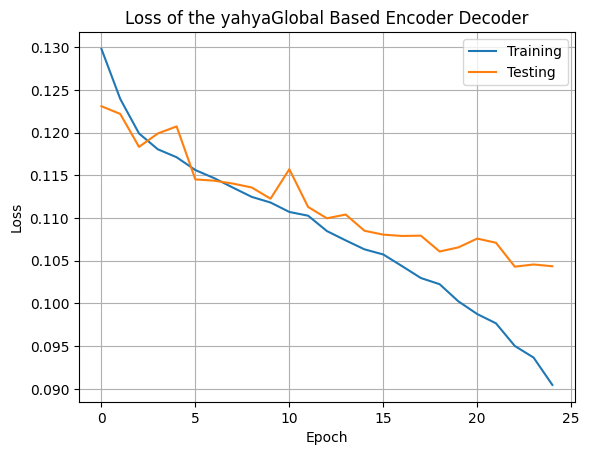

In [ ]:
## Training Loss
plot_loss(
    [train_loss_yahyaGlobal, test_loss_yahyaGlobal],
    "Loss of the yahyaGlobal Based Encoder Decoder",
    output_path + "loss_yahyaGlobal_BaseEncoder.jpg",
    save=True
    )


**Plot Analysis:**
- **Training loss decreases smoothly from 0.130 to approximately 0.090. This indicates that model is learning especially that there is not convergence.**
- **Testing loss decreases from 0.124 to approximately 0.105 with a zig-zag pattern but an overall expected behavior.**
- **While the testing loss is higher than the training loss, the gap is acceptable and does not indicate overfitting.**
- **The model can learn better with more epochs. Due to computational efficiency and time constraints, 25 epochs was chosen.**

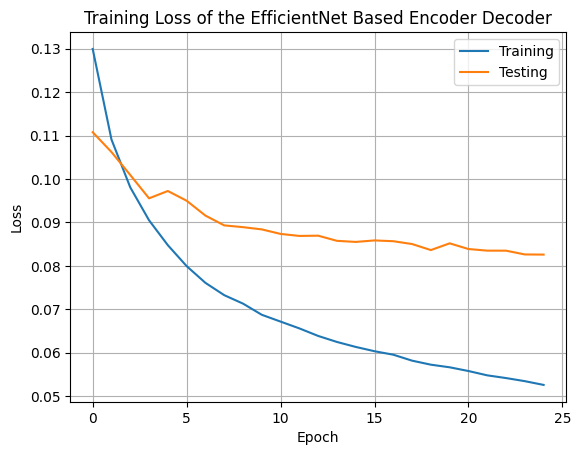

In [ ]:
## EfficientNet
plot_loss(
    [train_loss_efficientNet, test_loss_efficientNet],
    "Training Loss of the EfficientNet Based Encoder Decoder",
    output_path + "loss_efficientNet_BaseEncoder.jpg",
    save=True
    )


**Plot Analysis:**
- **Training loss smoothly decreases from approximately 0.13 to 0.053. It drops very vast in the first 5 epochs.**
- **Testing loss starts at approximately 0.11 and ends at about 0.083. After the first 5 epochs, the decreate rate of the loss is low and starts to converge.**
- **The gap between the training and the testing loss is 0.03, while still controllable and small within a safe range, it does indicate a bit of overfitting.**
- **While both training and testing loss are decreasing, more epochs might not be very beneficial as it can amplify the gap between the training and testing loss. It is only recommended if regularization is applied and more data is fed to compensate for the decreasing traning and testing loss due to regularization.**

**Comparsion between yahyaGlobal and efficientNET-B0:**


| Aspect               | yahyaGlobal           | EfficientNET-B0        |
|----------------------|-----------------------|------------------------|
| Final Training Loss  | 0.090                 | 0.053                  |
| Final Testing Loss   | 0.105                 | 0.083                  |
| Training Time        | 456 seconds           | 508 seconds            |
| Training-Testing Gap | 0.005                 | 0.03                   |

- **The customized global extractor based encoder-decoder was faster and more stable than the EfficientNET-B0 based model and less prone to overfitting. However, the EfficientNET model learned better global scene information as it produced less L1 error.**


#### Samples

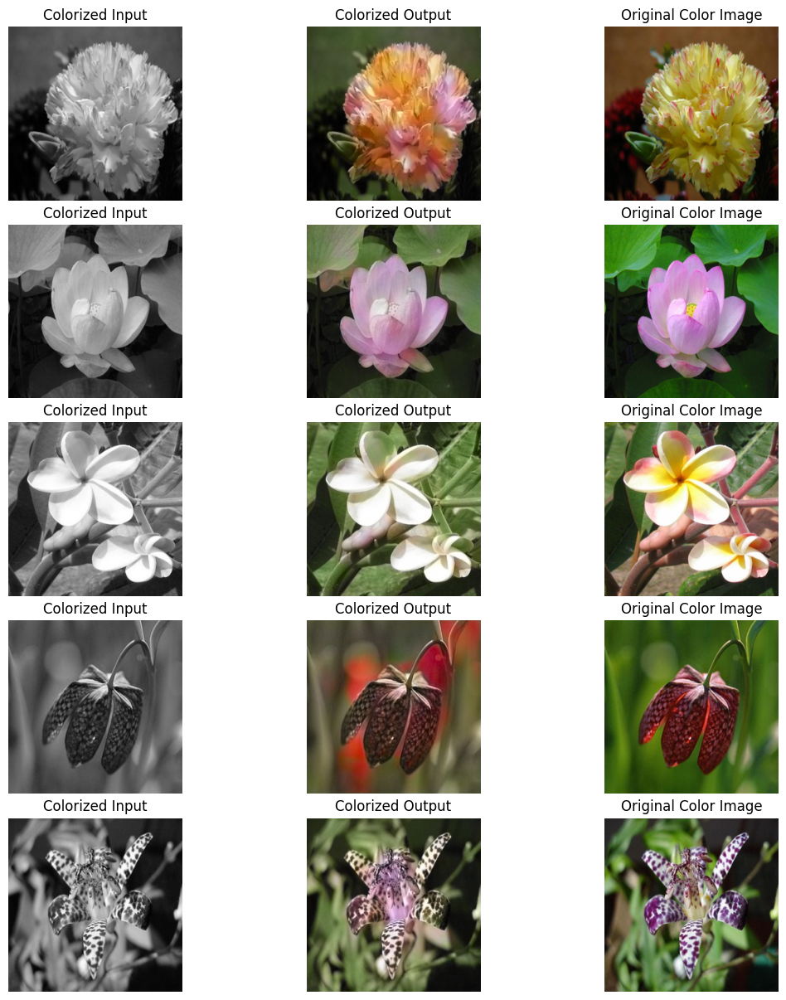

In [ ]:
## yahyaGlobal
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_yahyaGlobal, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "baseEncoderDecoder_yahyaGlobal.jpg",
    True)

- **Kind of beautiful**
- **The first thee and last image show the success of the yahyaGlobal based encoder decoder. The colors are present and close to the original color image but also a bit desaturated like in the second image where the pink color exists but in very low amount.**
- **In the fourth picture, the model was able to somehow seperate the background image from the flower through it pale green and the flower red. However, the red color has leaked into the surroundings of the flower. In fact that part of the image included complex boundaries due to the complex patterns of the flower. The yahyaGlobal feature extractor was not rich enough to accurately determine the right color to use. Another potential reason can be the failure of the low-mid level feature extractor to distinguish the edges between the flower and the background. To be determined in the next block of code.**
- **Overall good colorization despite the absence of complex implementation and additions.**

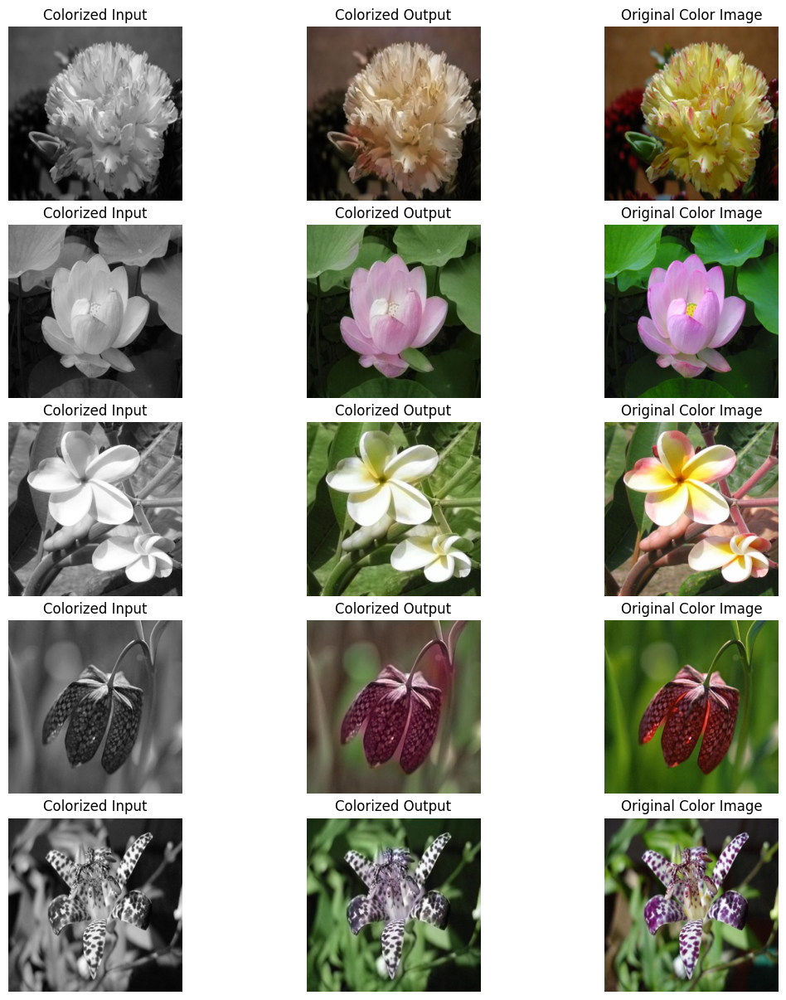

In [ ]:
## EfficientNet
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_efficientNet, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "baseEncoderDecoder_efficientNet.jpg",
    True)

- **Beautiful**
- **All pictures have great colorization and more saturated, but not so close to the original one. This shows strong color distribution acquisition and strong edge detection as well.**
- **The fourth picture is now colored correctly, with much less color bleeding than the previous samples. This suggests that color bleeding did not stem from low-mid level feature extractors but from the global feature extractor.**
- **EfficientNET had visually better color prediction with much superior smenatic seperation.**
- **While the first picture did not suffer from any color bleeding, both models failed to accurately color it. The yahyaGlobal model aggressively painted the first picture even though most of it was wrong. On the other hand, EfficientNET had more of an averaged pale wrong colorization. In fact, colorization is a hard process as a grayscale image can be mapped into different visually appealing colors. EfficientNET based model chose to color the first flower with safe averaged values to reduce the L1 error.**
- **EfficientNET-B0 architecture includes a smart size growth where it grows depth, width, and resolution in a balanced way. This allows a balanced semantic context learning process. In addition, [3] meantions that this global feature extractor includes squeeze-and-excitation (SE) blocks to improve feature representation that supressed misleading features and enhances correct ones. Wheareas the yahyaGlobal architecture only includes four convolutional layers that jumps from a single channel to 512 channels which can indicate the aggressiveness of the wrong colors in the first picture.**
<br />

**Final Table Comparsion:**
yahyaGlobal feature extractor: MSE 0.0245, PSNR 19.98, SSIM 0.8468649387359619

Efficient Net feature extractor: MSE 0.0163, PSNR 22.28, SSIM 0.8650146722793579



| Aspect               | yahyaGlobal            | EfficientNET-B0            |
|----------------------|------------------------|----------------------------|
| Final Training Loss  | 0.090                  | 0.053                      |
| Final Testing Loss   | 0.105                  | 0.083                      |
| Training Time        | 456 seconds            | 503 seconds                |
| Training-Testing Gap | 0.005                  | 0.03                       |
| MSE                  | 0.0245                 | 0.0163                     |
| PSNR                 | 19.98                  | 22.28                      |
| SSIM                 | 0.847                  | 0.865                      |
| Saturation           | Low - Moderate         | Higher but inadequate      |
| Color Bleeding       | More frequent          | Significantly reduced      |
| Overfitting          | Extremely Low          | Very low                   |

- **EfficientNET-B0 outperforms yahyaGlobal by having a higher chroma prediction (MSE), cleaner RGB reconstruction (PSNR), and more realistic predictions (SSIM).**

**NOTE: EfficientNET-B0 will be chosen as the global extractor for the rest of the models.**



## Architecture Imrovement

**The architectural improvements that were added are: Skip Connections.**
- **Skip Connections: This allows feature maps from earlier layers, such as the first and 3 convolutional layers as implemented in this assignment, jump directly to later layers instead of solely passing information through every intermediate convolution. This preserves spatial details that usually get lost due to downsampling in the encoding phase. This helps reduce color bleeding and blurry edges.**

### Training

In [ ]:
colorizer_skipConnection = train(25, "relu", lr=1e-4, global_mode="EfficientNetB0", skip_connections = True, batch_size=32)

Epoch: 1, Training Loss: 0.12193769910713521, Testing Loss: 0.10763954199277438, Time: 21.46s
Epoch: 2, Training Loss: 0.10508579738983294, Testing Loss: 0.10259184814416446, Time: 20.97s
Epoch: 3, Training Loss: 0.09470209911829088, Testing Loss: 0.09749781770201829, Time: 21.12s
Epoch: 4, Training Loss: 0.08750794369999955, Testing Loss: 0.09494660164301212, Time: 21.02s
Epoch: 5, Training Loss: 0.08137101229371094, Testing Loss: 0.09420897295841804, Time: 21.03s
Epoch: 6, Training Loss: 0.07726165488725756, Testing Loss: 0.0903197478216428, Time: 21.04s
Epoch: 7, Training Loss: 0.07404418587684632, Testing Loss: 0.08879156238757648, Time: 21.10s
Epoch: 8, Training Loss: 0.07139896621427885, Testing Loss: 0.08780951310808842, Time: 21.08s
Epoch: 9, Training Loss: 0.06875712293677214, Testing Loss: 0.08709818268051514, Time: 21.08s
Epoch: 10, Training Loss: 0.06661224050856218, Testing Loss: 0.08682645771365899, Time: 21.16s
Epoch: 11, Training Loss: 0.06533952600708821, Testing Loss:

### Testing

In [ ]:
loss_skipConnection, pred_skipConnection = test(colorizer_skipConnection)

### Exporting the model

In [ ]:
export_data(
    pred_skipConnection,
    colorizer_skipConnection.training_loss,
    colorizer_skipConnection.testing_loss,
    "drive/MyDrive/AIN 433 - Computer Vision Lab - Assignment 3/model_data/loss_pred_X_skipConnections.pkl")

Saved Successfully!


### Loading the Model

In [ ]:
data_skipConnection = load_data(model_path + "loss_pred_X_skipConnections.pkl")

In [ ]:
train_loss_skipConnection, test_loss_skipConnection, pred_skipConnection = list(data_skipConnection.values())

### Evaluation

In [ ]:
mse_skipConnection, psnr_skipConnection, ssim_skipConnection = evaluate_metrics(pred_skipConnection, y_test)
print(f"EfficientNET-B0 + Skip Connection: MSE {mse_skipConnection:.4f}, PSNR {psnr_skipConnection:.2f}, SSIM {ssim_skipConnection}")

EfficientNET-B0 + Skip Connection: MSE 0.0156, PSNR 22.49, SSIM 0.8721950054168701


### Visualization

#### Plots

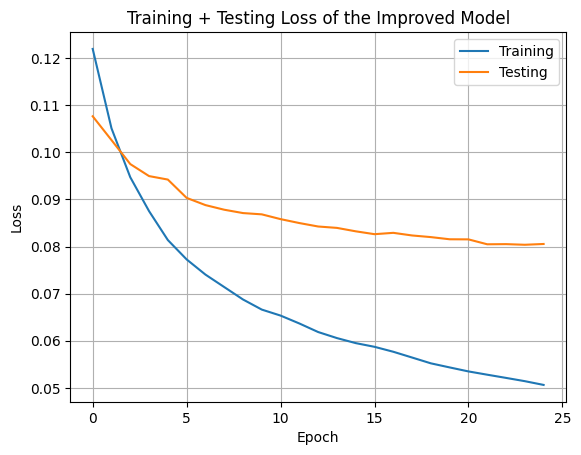

In [ ]:
## Testing Loss
plot_loss(
    [train_loss_skipConnection, test_loss_skipConnection],
    "Training + Testing Loss of the Improved Model",
    output_path + "loss_efficientNet_skipConnection.jpg",
    save=True
    )


**Testing Score Analysis:**
- **The MSE is 0.0156. It is lower than the previous effcientNet model. It indicates that the model predicts chroma values numerically closer to the actual values.**
- **PSNR is 22.49 dB indicates clean RGB reconstruction. This is higher than the PSNR of the previous efficient net based model.**
- **SSIM is 0.872 which is moderately higher than the efficient net model.**
- **According to these scores, the architectural upgrades did result in a noticeable improvement and increases in all metrics potentially achieving a little better perceptual and structural alignment.**

**Plot Analysis:**
- **Training loss decreases smoothly from approximately 0.120 to 0.051 which is lower that the training loss scores in the efficient net model. This indicates better stable learning process.**
- **Testing loss also decreases from 0.110 to 0.0805 which is slightly better to the final testing loss in the efficent net model. The architecrual upgrades kept the same good generaliaztion without hindering or improving the L1 testing loss.**
- **The gap between training and testing remains the same.**
- **The training finished in approximately 527 seconds which is 19 more seconds than the previous model.**

#### Samples

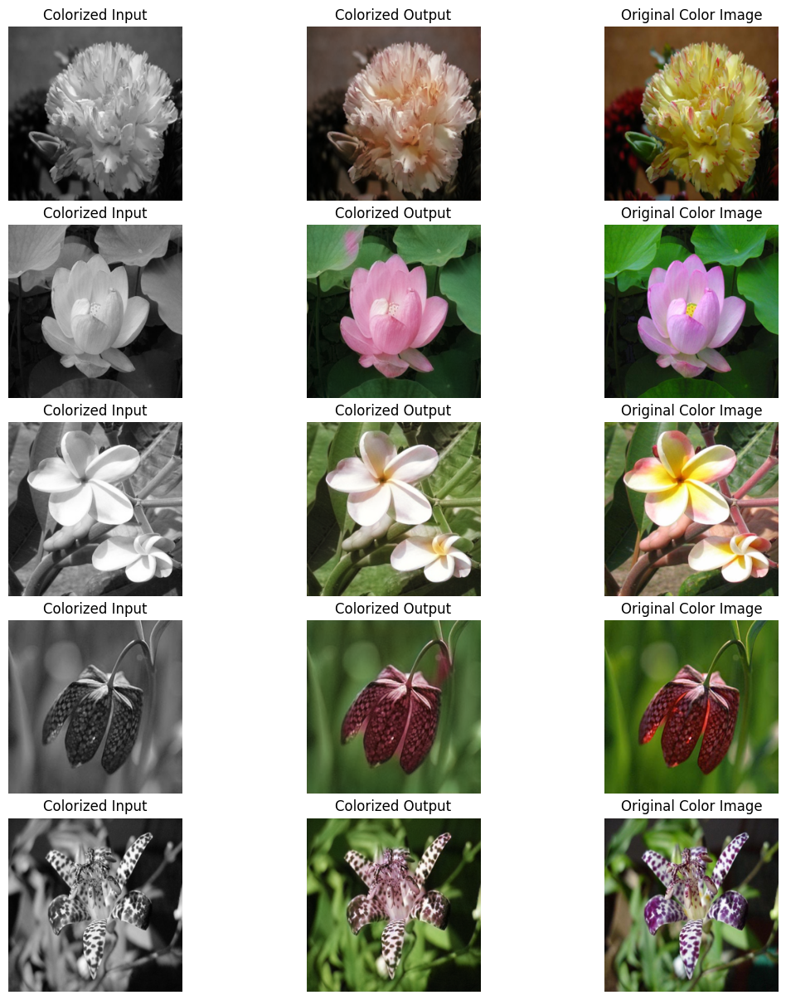

In [ ]:
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_skipConnection, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "efficientNet_skipConnection.jpg",
    True)


- **More beautiful**
- **All images are a bit more saturated than the ones in the efficient net.**
- **The model improvements were able to mitigate color bleeding in the second and the fourth image where it very much resembles the original color image more than the previous models. However, there is still some visible color leakage in the fourth image. Observing the grayscale input, the leaked spot has low intensity value which made it similar to the ones in the flower. This shows that while skip connections re-add spatially fine information, they are still  prone to color ambiguity. The model became biases towards the dominant color learned from the flower. This effect can potentially be explained by the L1 loss which encourages averaged values.**
- **While the pink intensity is closer to the real in the second image, the pink color leakage was a bit amplified as well. This can be explained due to ambiguous boundary region failure from the low-mid level feature extraction phase. Since early convolutions were added to the decoder phase, the edges were not completely identified. This has led to unstable color assignments.**
- **Not a single model was able to distinguish the hand touching the flower in the third image assigning them as part of the green section of the flower. This is expected since this is a flower based dataset. As a result, alien shapes like hands cannot be recognized.**
- **The majority of the images in all models had lower, but reasonable,  saturation than the original. This can potentially be explained by the L1-based optimization. The model is rewarded from predicting averaged colors than saturated ones. High saturation increases error if the hue is slight different than the correct one. As a result the encoder-decoder assigns safe averged colors rather than saturated ones. This hypothesis should be verified after applying perceptual loss.**

**Final Table Comparsion:**



| Aspect               | Improvements           | EfficientNET-B0            |
|----------------------|------------------------|----------------------------|
| Final Training Loss  | 0.054                  | 0.055                      |
| Final Testing Loss   | 0.085                  | 0.085                      |
| Training Time        | 527 seconds            | 508 seconds                |
| MSE                  | 0.0156                 | 0.0163                     |
| PSNR                 | 22.49                  | 22.28                      |
| SSIM                 | 0.872                  | 0.865                      |
| Saturation           | Better                 | Moderate                   |
| Color Bleeding       | Less frequent          | More frequent              |
| Overfitting          | Extremely Low          | Very low                   |

**NOTE: Due to the imporvement coming this architectural change, skip connection is enabled in the rest of the models.**

## Perceptual Loss

**NOTE: While perceptual loss was implemented in the training phase to update the parameters according to the loss value, the L1 loss was used in testing phase. This is potenitally better to consistently compare different models since perceptual loss and L1 loss have different scales.**

### Training

In [ ]:
colorizer_efficienNet_perceptualLoss = train(25, "relu", 1e-4, "EfficientNetB0", skip_connections=True, loss_func="perceptualLoss", batch_size=32)

Epoch: 1, Training Loss: 0.2694879197492832, Testing Loss: 0.1236903601540969, Time: 35.23s
Epoch: 2, Training Loss: 0.24075688625254282, Testing Loss: 0.11545440669243152, Time: 34.18s
Epoch: 3, Training Loss: 0.23230164807017256, Testing Loss: 0.10888438958388108, Time: 33.97s
Epoch: 4, Training Loss: 0.22572962045669556, Testing Loss: 0.1033587994483801, Time: 33.93s
Epoch: 5, Training Loss: 0.2198372598828339, Testing Loss: 0.10227185888932301, Time: 33.99s
Epoch: 6, Training Loss: 0.21510348058328396, Testing Loss: 0.09876749521264663, Time: 34.12s
Epoch: 7, Training Loss: 0.21065826597737103, Testing Loss: 0.09649828506203798, Time: 33.96s
Epoch: 8, Training Loss: 0.20696670376672976, Testing Loss: 0.0959225411598499, Time: 33.92s
Epoch: 9, Training Loss: 0.20341985436474405, Testing Loss: 0.09176947491673323, Time: 33.93s
Epoch: 10, Training Loss: 0.19980740329114402, Testing Loss: 0.09016714245080948, Time: 33.93s
Epoch: 11, Training Loss: 0.19726724959001307, Testing Loss: 0.0

In [ ]:
colorizer_efficienNet_combined_test = train(25, "relu", 1e-4, "EfficientNetB0", skip_connections=True, loss_func="both", batch_size=32)

Epoch: 1, Training Loss: 0.14505245994503904, Testing Loss: 0.1063425515133601, Time: 34.55s
Epoch: 2, Training Loss: 0.12424005764286693, Testing Loss: 0.10257382060472782, Time: 33.95s
Epoch: 3, Training Loss: 0.11427082510256185, Testing Loss: 0.09755341680004047, Time: 33.90s
Epoch: 4, Training Loss: 0.10653079584604357, Testing Loss: 0.09403041635568325, Time: 33.84s
Epoch: 5, Training Loss: 0.10027000682383048, Testing Loss: 0.09507047843474609, Time: 33.95s
Epoch: 6, Training Loss: 0.09560257247308405, Testing Loss: 0.0907725293475848, Time: 33.92s
Epoch: 7, Training Loss: 0.09150111667993592, Testing Loss: 0.09000008467298287, Time: 34.08s
Epoch: 8, Training Loss: 0.0890538916355226, Testing Loss: 0.0900354809485949, Time: 33.95s
Epoch: 9, Training Loss: 0.08642814203006466, Testing Loss: 0.08679944849931277, Time: 34.03s
Epoch: 10, Training Loss: 0.08438188262828966, Testing Loss: 0.08768700922910984, Time: 33.97s
Epoch: 11, Training Loss: 0.08219290353902957, Testing Loss: 0.

### Testing

In [ ]:
loss_efficientNet_percLoss, pred_efficientNet_percLoss = test(colorizer_efficienNet_perceptualLoss)

In [ ]:
loss_efficientNet_combines, pred_efficientNet_combined = test(colorizer_efficienNet_combined_test)

### Exporting the Models

In [ ]:
export_data(
    pred_efficientNet_percLoss,
    colorizer_efficienNet_perceptualLoss.training_loss,
    colorizer_efficienNet_perceptualLoss.testing_loss,
    model_path + "loss_pred_X_efficientNet_percLoss.pkl")

Saved Successfully!


In [ ]:
export_data(
    pred_efficientNet_combined,
    colorizer_efficienNet_combined_test.training_loss,
    colorizer_efficienNet_combined_test.testing_loss,
    model_path + "loss_pred_X_efficientNet_combined.pkl")


Saved Successfully!


### Loading Models

In [ ]:
data_efficientNet_percLoss = load_data(model_path + "loss_pred_X_efficientNet_percLoss.pkl")

In [ ]:
data_efficientNet_combined = load_data(model_path + "loss_pred_X_efficientNet_combined.pkl")

In [ ]:
train_loss_efficientNet_percLoss, test_loss_efficientNet_percLoss, pred_efficientNet_percLoss = list(data_efficientNet_percLoss.values())

In [ ]:
train_loss_efficientNet_combined, test_loss_efficientNet_combined, pred_efficientNet_combined  = list(data_efficientNet_combined.values())

### Evaluation

In [ ]:
mse_percLoss, psnr_percLoss, ssim_percLoss = evaluate_metrics(pred_efficientNet_percLoss, y_test)
print()
print(f"EfficientNet perceptual loss feature extractor: MSE {mse_percLoss:.4f}, PSNR {psnr_percLoss:.2f}, SSIM {ssim_percLoss}")


EfficientNet perceptual loss feature extractor: MSE 0.0152, PSNR 22.38, SSIM 0.8626530170440674


In [ ]:
mse_combined, psnr_combined, ssim_combined = evaluate_metrics(pred_efficientNet_combined, y_test)
print()
print(f"EfficientNet perceptual loss with L1 loss feature extractor: MSE {mse_combined:.4f}, PSNR {psnr_combined:.2f}, SSIM {ssim_combined  }")


EfficientNet perceptual loss with L1 loss feature extractor: MSE 0.0154, PSNR 22.56, SSIM 0.8716097474098206


### Visualization

#### Plots

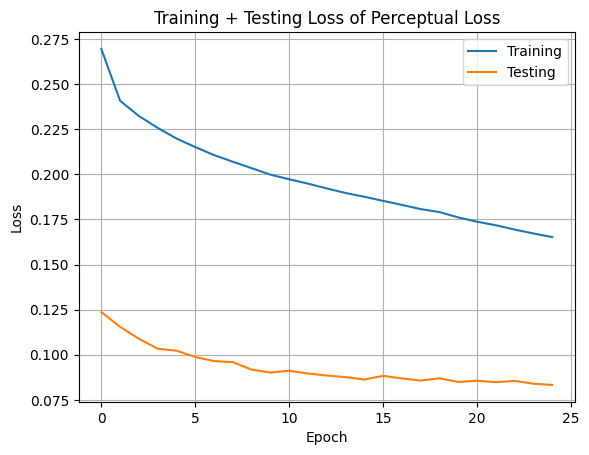

In [ ]:
## Testing Loss
plot_loss(
    [train_loss_efficientNet_percLoss, test_loss_efficientNet_percLoss],
    "Training + Testing Loss of Perceptual Loss",
    output_path + "loss_perceptualLoss.jpg",
    save=True
    )


**Testing Score Analysis:**

- **The MSE has a score of 0.0152 which is the highest compared to all previous models.**
- **PSNR increased to 22.38 dB which is slightly higher than all models.**
- **SSIM is 0.863 which shows strong structural and perceptual alignment. Yet, there is a slight drop compared to the previous best SSIM (0.865). However, this drop might not indicate a major visual difference.**

**Plot Anaylsis:**
- **Note: perceptual loss was only used in training not in testing. The L1 loss was used in testing to have an easier comparison to the previous models.**
- **Training loss decreases smoothly from approximately 0.275 to 0.165. This shows optimization and that the network is successfully learning deep perceptual features, not just pixel values.**
- **Testing loss is in the same range as the previous best models slowly decreasing from 0.125 to 0.083.**
- **More epochs with regulrazation can potentially improve the generliazation of the model. Regulrazation is important because the testing loss converges in the last 10 epochs.**

- **According to these results, the model has outperformed the previous models in all metrics except SSIM (still very high). The testing losses are within the normal range as well.**

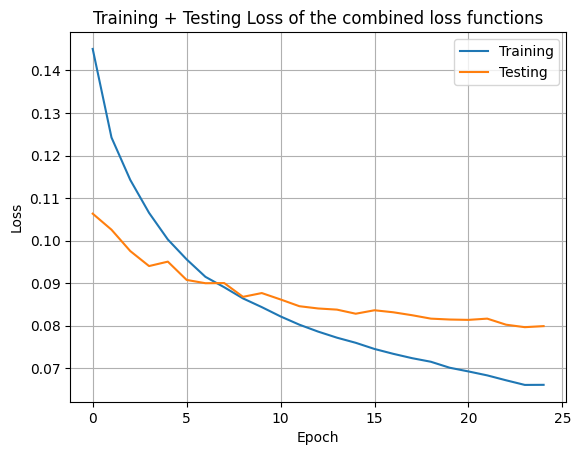

In [ ]:
## Testing Loss
plot_loss(
    [train_loss_efficientNet_combined, test_loss_efficientNet_combined],
    "Training + Testing Loss of the combined loss functions",
    output_path + "loss_combined.jpg",
    save=True
    )


**Metric Analysis:**

- **MSE decreased to 0.0154 to be ranked the best so far. This indicates that this model has the most accurate ab numerical values prediction.**
- **PSNR increased to 22.56 which shows the cleanest RGB reconstruction.**
- **SSIM reached 0.872 which indicates the best structural and perceptual alignment. This model potentially has the minimal color bleeding and best visual realism with the actual image.**

**Plot Analysis:**
- **Training loss drops smoothly from 0.145 to 0.066. While the scale is not the accurately same as the previous models, the overall shape of the plot exhibits the same behavior of the previous best models.**
- **Testing loss decreases from approximately 0.109 to 0.079.**
- **While the training and testing loss have slightly different scales (the perceptual loss was multiplied by 0.03 to equate it to the L1 scale), it can be derived that the model does not suffer from overfitting as the gap is significant.**

#### Samples



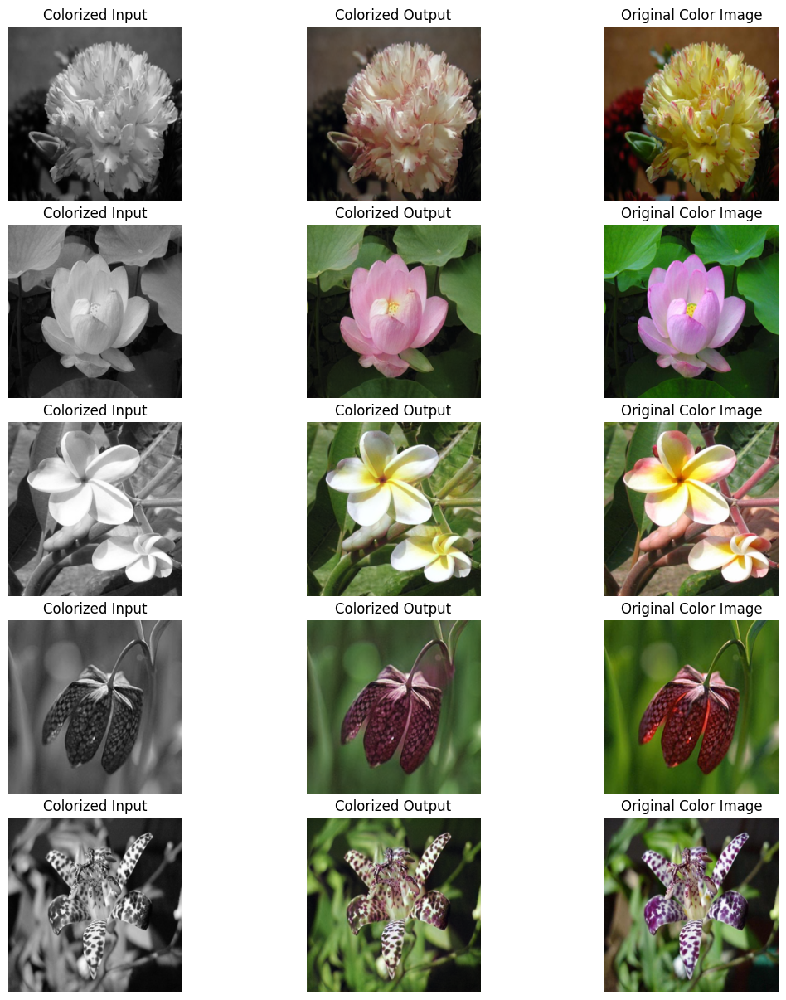

In [ ]:
# Perceptual Loss Only
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_efficientNet_percLoss, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "efficientNet_percLoss.jpg",
    True)

- **Slight more beautiful**
- **The hypothesis made before that the desaturation was due to the L1 loss function makes sense but was not strongly demonstrated in this experiment. Looking at the second picture, the green leaves a bit more dissaturated than the previous image with L1 only. However, deeply focusing on the fourth image (no imagination), there is a tiny increase in color expressiveness.**
- **Perceptual loss helped decrease the color bleeding in the second image, leaving very weak color leakage.**


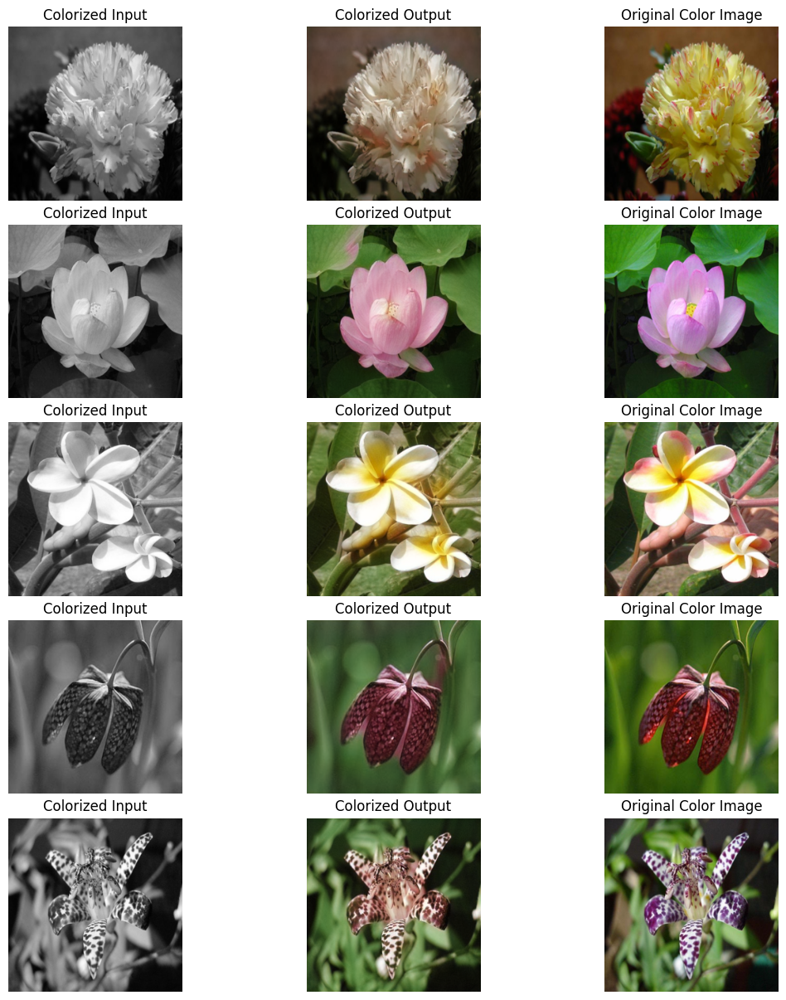

In [ ]:
# Perceptual Loss combined with L1 Loss
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_efficientNet_combined, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "efficientNet_combined.jpg",
    True)

- **Overall -> Noice!**
- **While still inaccruately colored, the first image has a flower hue that is closer to the real yellow in the original image.**
- **The second picture is more saturated than the previous one. However, some pink was leaked to the surrounding leaf again. As a result, it can be deduced from here than the L1 loss is reponsible for that. Indeed, L1 loss reinforces pixel-wise accuracy as shown before in its mathematical formula. Yet, it can also spread chormatic noise across very close and similar grayscale intensity values.**
- **So far, the hand and the pink spots in the white flower of the third picture were not recognized. In fact, the pink spot on the white flower is a small, rare, and fine-scale feature. It is visually subtle in the grayscale image, and dark white is as visually appealing as the real pink color. Despite the power of this model, it is only optimized to learn dominant color regions not tiny color accents.**
- **Despite that this model has some color leakage as spotted in the fourth image, it has great boundary detection. For instance, picture four has a redish color instead of full green. However, it only has this false color in the dark spot in the grayscale image and does not exceed that. Similarly, the last image had an amplified reddish color in the center of the flower, it did not leak to the background despite the complexity of the flower.**
- **L1 and perceptual loss are a great combination because they can be considered as complimentary. Perpceptual loss enforces semantic correctness and plausible visual structure using deep features. L1 enforces direct pixel-wise color alignment between the predicted and actual ab image. This potentially leads to a dual regularization effect through preventing the safe averaged colorization along with penalizing incorrect hallucinations through pixel-wise comparison.**


**The best model so far:**
- **PERCEPTUAL & L1 LOSS + EFFICINET NET + SKIP CONNECTION BASED MODEL**

 ## PatchGAN Discriminator

### Important Functions

In [ ]:
def train_patchGAN(epochs=25, lr=1e-4):
  """
  Trains the patchGAN discriminator model.

  Parameters
  ----------
  epochs : int, default 25
    Number of training epochs.

  lr : float, default 1e-4
    Learning rate for the optimizer.

  Returns
  -------
  tuple:
    colorizer: the trained encoder-decoder model (generator)
    train_loss: list of training losses
    train_patchGAN_losses: list of patchGAN losses
    test_loss: list of testing losses
  """
  train_dataset = TensorDataset(X_train, y_train)
  train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
  num_batches = len(train_loader)
  colorizer = EncoderDecoder(
      "relu",
      X_train[0].shape,
      "EfficientNetB0",
      1000,
      skip_connections=True,
      )
  colorizer.to(device)

  patchGAN_conv = patchGAN(in_channels=3).to(device)

  optimizer_colorizer = optim.Adam(colorizer.parameters(), lr=lr) # "Generator"
  optimizer_patchGAN = optim.Adam(patchGAN_conv.parameters(), lr=lr * 0.5) # Discriminator

  loss_function_colorizer = nn.L1Loss()
  loss_function_pathGAN = nn.MSELoss()
  #loss_function_pathGAN = nn.L1Loss()

  patience = 5
  best_loss = float('inf')
  counter = 0
  previous_loss = 0

  train_loss = []
  train_patchGAN_losses = []
  test_loss = []
  total_start_time = time.time()
  for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    running_loss_colorizer = 0
    running_loss_patchGAN = 0

    for X_batch, y_batch in train_loader:
      X_batch, y_batch = X_batch.to(device), y_batch.to(device)

      colorizer_output = colorizer(X_batch)

      real_input = torch.cat([X_batch, y_batch], dim=1)
      fake_input = torch.cat([X_batch, colorizer_output.detach()], dim=1)

      pred_real = patchGAN_conv(real_input)
      pred_fake = patchGAN_conv(fake_input)

      loss_pathGAN = loss_function_pathGAN(pred_real, torch.ones_like(pred_real)) + loss_function_pathGAN(pred_fake, torch.zeros_like(pred_fake))

      optimizer_patchGAN.zero_grad()
      loss_pathGAN.backward()
      optimizer_patchGAN.step()

      fake_input = torch.cat([X_batch, colorizer_output], dim=1)
      pred_fake = patchGAN_conv(fake_input)

      loss_colorizer_pathGAN = loss_function_pathGAN(pred_fake, torch.ones_like(pred_fake))
      loss_colorizer = loss_function_colorizer(colorizer_output, y_batch)

      # The colorizer loss was multiplied by a number (in this case 100) to place
      # a stronger emphasis on it. This potentially forces the encoder-decoder
      # to predict more realistic color assignments. For better understanding, this can be compared
      # to the regularizer lambda coefficient, the larger the lambda the lower the weights should be.
      # Same thing is applied here, the larger the multiplier, the lower the loss should be.
      loss_colorizer = loss_colorizer_pathGAN + 100 * loss_colorizer

      optimizer_colorizer.zero_grad()
      loss_colorizer.backward()

      optimizer_colorizer.step()

      running_loss_colorizer += loss_colorizer.item()
      running_loss_patchGAN += loss_pathGAN.item()


    loss_test, = test(colorizer, False)
    epoch_colorizer_loss = running_loss_colorizer / num_batches
    epoch_patchGAN_loss = running_loss_patchGAN / num_batches

    train_loss.append(epoch_colorizer_loss)
    train_patchGAN_losses.append(epoch_patchGAN_loss)
    test_loss.append(loss_test)

    epoch_end_time = time.time()
    epoch_duration = epoch_end_time - epoch_start_time

    print( f"Epoch {epoch} colorizer Loss: {epoch_colorizer_loss:.4f} patchGAN Loss: {epoch_patchGAN_loss:.4f}, Test loss {loss_test}, Time: {epoch_duration}s"
        )

  total_end_time = time.time()
  total_training_duration = total_end_time - total_start_time
  print(f"Training Finished. The training duration is {total_training_duration:.0f} seconds")
  return (colorizer, train_loss, train_patchGAN_losses, test_loss)


### Training

In [ ]:
colorizer_pathGAN, train_loss, train_pathGAN_losses, test_loss = train_patchGAN(25)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 231MB/s]


Epoch 1 colorizer Loss: 13.0136 patchGAN Loss: 0.3682, Test loss 0.11295686117731608, Time: 30.541865348815918s
Epoch 2 colorizer Loss: 11.5484 patchGAN Loss: 0.2597, Test loss 0.10571398270817903, Time: 27.85814380645752s
Epoch 3 colorizer Loss: 10.6709 patchGAN Loss: 0.2376, Test loss 0.10882265349993339, Time: 27.83753228187561s
Epoch 4 colorizer Loss: 9.9299 patchGAN Loss: 0.2498, Test loss 0.10105072162472285, Time: 27.90791368484497s
Epoch 5 colorizer Loss: 9.3583 patchGAN Loss: 0.2956, Test loss 0.10242906212806702, Time: 27.936493158340454s
Epoch 6 colorizer Loss: 8.8839 patchGAN Loss: 0.3124, Test loss 0.09821241148389302, Time: 27.992052793502808s
Epoch 7 colorizer Loss: 8.4546 patchGAN Loss: 0.3338, Test loss 0.09524021297693253, Time: 28.036992073059082s
Epoch 8 colorizer Loss: 8.1813 patchGAN Loss: 0.3359, Test loss 0.09537082738601245, Time: 27.96351432800293s
Epoch 9 colorizer Loss: 7.8774 patchGAN Loss: 0.3524, Test loss 0.09464543513380565, Time: 27.924723148345947s
Ep

In [ ]:
# OPTIONAL TO LOOK AT
# THIS SHOWS THAT THE L1 LOSS WITH PATCHGAN WAS NOT AS GOOD AS THE MSE LOSS FUNCTION

# colorizer_pathGAN, train_loss, train_pathGAN_losses, test_loss = train_patchGAN(25)

Epoch 1 colorizer Loss: 13.2540 patchGAN Loss: 0.6982, Test loss 0.1118855608197359, Time: 28.36510968208313s
Epoch 2 colorizer Loss: 11.7002 patchGAN Loss: 0.5437, Test loss 0.10829307626073177, Time: 28.03262495994568s
Epoch 3 colorizer Loss: 10.7237 patchGAN Loss: 0.5606, Test loss 0.10213502324544467, Time: 28.178598165512085s
Epoch 4 colorizer Loss: 9.9668 patchGAN Loss: 0.5741, Test loss 0.09737764614132735, Time: 28.074542999267578s
Epoch 5 colorizer Loss: 9.3669 patchGAN Loss: 0.6027, Test loss 0.0957102096424653, Time: 28.078870058059692s
Epoch 6 colorizer Loss: 9.0117 patchGAN Loss: 0.6046, Test loss 0.09661649282162006, Time: 28.0058650970459s
Epoch 7 colorizer Loss: 8.6772 patchGAN Loss: 0.6502, Test loss 0.09519087838438842, Time: 28.075995206832886s
Epoch 8 colorizer Loss: 8.3872 patchGAN Loss: 0.6791, Test loss 0.09139715335690059, Time: 27.94138765335083s
Epoch 9 colorizer Loss: 8.1282 patchGAN Loss: 0.7030, Test loss 0.09245079755783081, Time: 28.048359870910645s
Epoch

### Testing

In [ ]:
loss_patchGAN, pred_patchGAN = test(colorizer_pathGAN)

### Exporting the Model

In [ ]:
data = {
  "training_loss":train_loss,
  "testing_loss":test_loss,
  "patchGAN_loss":train_pathGAN_losses,
  "pred":pred_patchGAN,

}
try:
  with open(model_path + "loss_pred_X_efficientNet_patchGAN.pkl", "wb") as f:
    pickle.dump(data, f)
  print("Saved Successfully!")
except Exception as e:
  print(e)

Saved Successfully!


### Loading Model

In [ ]:
data_skipConnection_conved = load_data(model_path + "loss_pred_X_efficientNet_patchGAN.pkl")

In [ ]:
train_loss, test_loss, train_pathGAN_losses, pred_patchGAN = list(data_skipConnection_conved.values())

### Evaluation

In [ ]:
mse_patchGAN, psnr_patchGAN, ssim_patchGAN = evaluate_metrics(pred_patchGAN, y_test)
print(f"patchGAN based model metrics: MSE {mse_patchGAN:.4f}, PSNR {psnr_patchGAN:.2f}, SSIM {ssim_patchGAN}")

patchGAN based model metrics: MSE 0.0178, PSNR 21.78, SSIM 0.8410374522209167


**Metrics Analysis:**
- **MSE is 0.0164 which is quite low and very similar to the previous MSE scores. This indicates a stable generator ab prediction.**
- **PSNR is 22.10dB which is higher than most models except the model combined with perceptual loss, skip connection, and the L1 loss. This indicates the patchGAN created visually strucutred output.**
- **SSIM is 0.0848 which is lower than some models. Yet, it is that the model effectively preserved the overall structure, constrast, and local patterns making it align with human perception.**

In [ ]:
# OPTIONAL TO LOOK AT
# THIS SHOWS THAT THE L1 LOSS WITH PATCHGAN WAS NOT AS GOOD AS THE MSE LOSS FUNCTION

# mse_patchGAN, psnr_patchGAN, ssim_patchGAN = evaluate_metrics(pred_patchGAN, y_test)
# print(f"L1 LOSS patchGAN based model metrics: MSE {mse_patchGAN:.4f}, PSNR {psnr_patchGAN:.2f}, SSIM {ssim_patchGAN}")

L1 LOSS patchGAN based model metrics: MSE 0.0170, PSNR 22.02, SSIM 0.8465559482574463


### Visualization

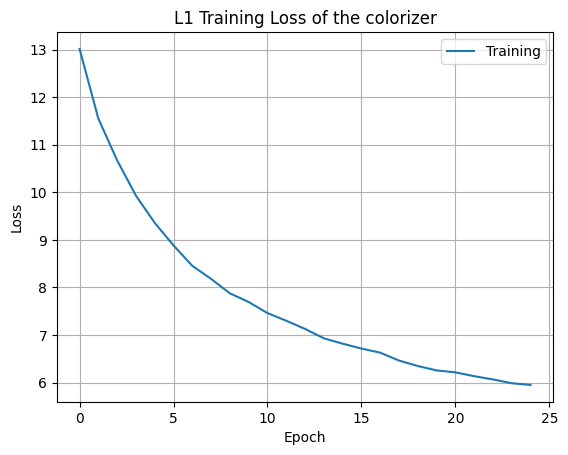

In [ ]:
## Testing Loss
plot_loss(
    [train_loss],
    "L1 Training Loss of the colorizer",
    output_path + "train_loss_patchGan.jpg",
    save=True
    )


**Plot Analysis:**
- **Loss smoothly drops from approximately 13 to about 5.9 in the final epoch.**
- **This means the encoder-decoder is minimizing the error in the AB prediction and has a stable learning process.**

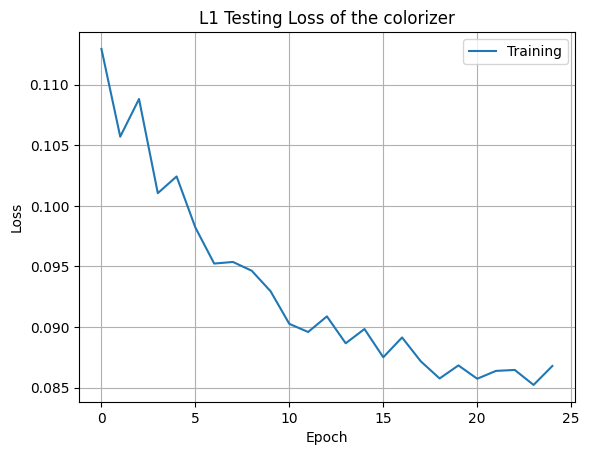

In [ ]:
## Testing Loss
plot_loss(
    [test_loss],
    "L1 Testing Loss of the colorizer",
    output_path + "test_loss_patchGan.jpg",
    save=True
    )


**Plot Analysis:**
- **Loss drops from about 0.113 to 0.086.**
- **There are some oscillations (zig-zag style) downward trend. However, the training and the testing curves follow the same decreasing direction.**
- **Overall, the testing loss is the same along all models.**
- **The small fluctuations in the L1 loss can be explained due to the adversarial feedback beteween the colorizer (generator) and the patchGAN (discirminator).**

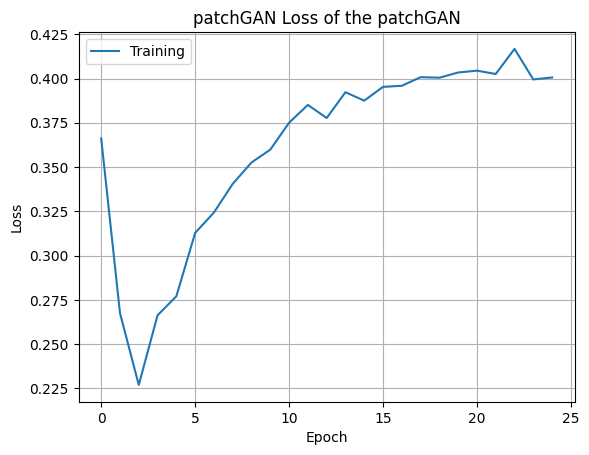

In [ ]:
## Testing Loss
plot_loss(
    [train_pathGAN_losses],
    "MSE Training Loss of patchGAN",
    output_path + "train_loss_patchGan.jpg",
    save=True
    )


**Plot Analysis:**
- **Loss starts around 0.36, then drops quickly to about 0.225, and increase again to 0.4**
- **The early drop indicates that the discriminator learns fast and the generator was not able to beat it in the first 2/3 epochs.**
- **Due to the 100 lambda coefficient of the generator loss, the whole model emphasizes on the generator loss more than the patchGAN loss. As the colorizer learns more and improves, the patchGAN discriminator finds it more challenging to distinguish between fake from real. As a result, the MSE increases.**

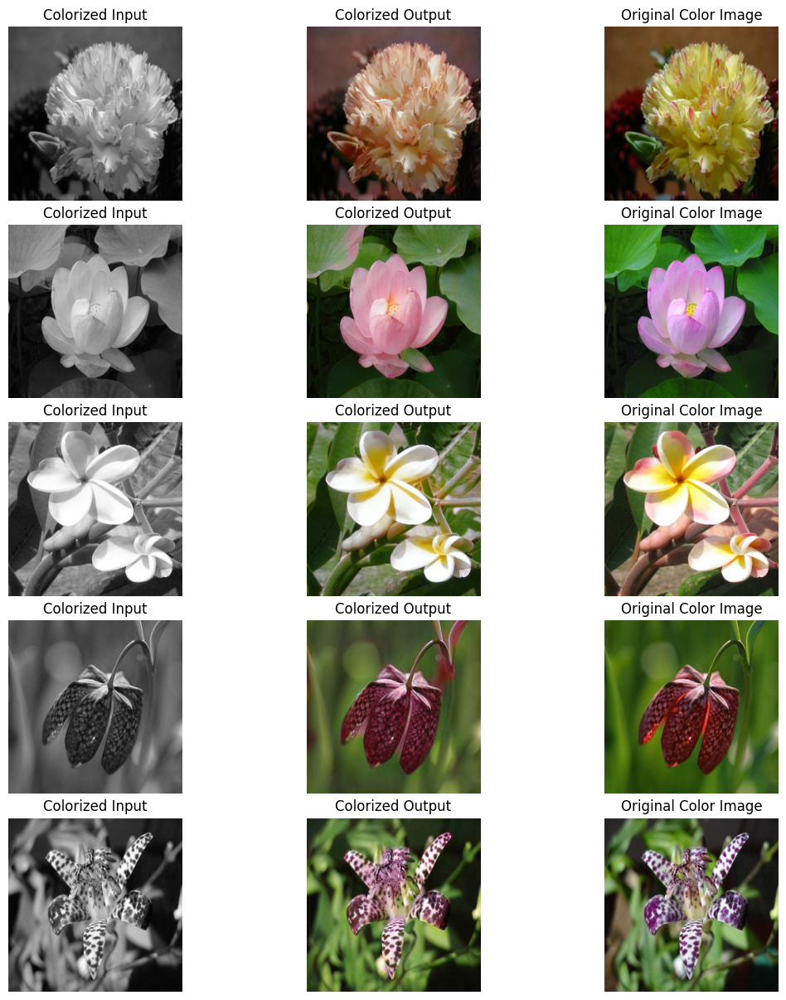

In [ ]:
# L1 LOSS IN PATCHGAN
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_patchGAN, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "efficentNet_patchGAN.jpg",
    True)

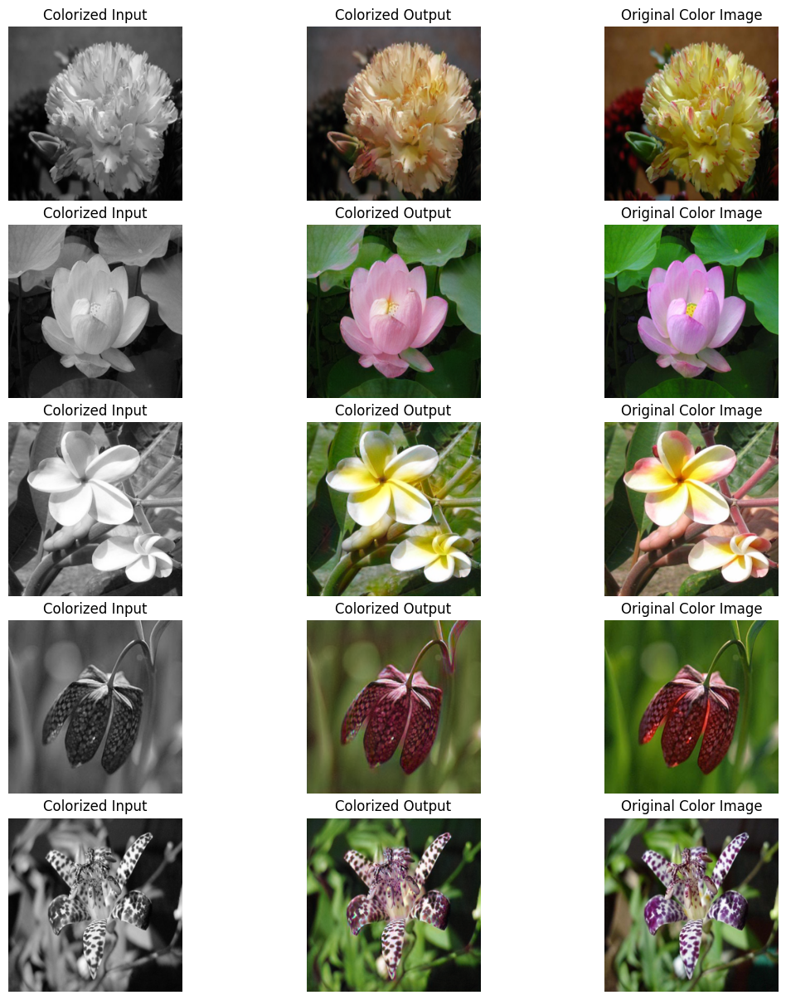

In [ ]:
# MSE LOSS IN PATCHGAN
start_index = 20
end_index = 25
show_l_pred_real(
    X_test[start_index:end_index],
    np.concatenate(pred_patchGAN, axis=0)[start_index:end_index],
    y_test[start_index:end_index],
    output_path + "efficentNet_patchGAN.jpg",
    True)

- **The patchGAN model demonstrates strong color assignment to the flowers and the green background with low color bleeding in some images.**
- **The second and fourth image suffer a little bit from color bleeding where the pink color in the second image was leaked to some other leaves and the red color in the fourth image leaked to the supposedly green background. In fact, as mentioned in the assignment pdf, patchGAN does not classify the whole image as real or fake, but only judges local patches instead of full global semantic consistency. It can provide little penalty for a slight leakage of a dominant color in background leaves.**
- **The hand in the third image is still not recognized and this is mainly due to the dataset used, more than the architecture of the model. Furthermore, it has more accurate yellow in the flower compared to previous models, yet it was not able to recognize the small fine details in the flower edges.**
- **These results matches the metric scores previously analyzed.**
- **Deeply observing the first image, a little bit of improvement can be noticed between this model and the previous ones where the flower is closer to its true color, yet not fully accurate. The background looks very similar as the grayscale image. We can infer that the model was not able to assign a color to it and ended up with a safe averaged color assignment.**

**Final Comparsion:**
- **The base efficinetNet model had good semantic understanding and was able to overall recgonize the foreground flowers from the green background along with low color bleeding and overfitting. However, it applied color averaging due to the L1 loss leading to some degree of desaturation in the images and struggled with fine texture edges.**
- **Adding skip connections improved overall model scores and decreased color bleeding in all images thanks to preserving detailed information before downsampling them.**
- **The combination of perceptual loss along with L1 loss created a balance betwene saturation and hue trade off.**
- **patchGAN performed better than the base models without patchGAN but it was similar to the models after adding architectural changes (skip connections and perceptual loss). While it suffered from color bleeding in the second picture, the flower colors were more visually appealing and closer to the original images than the ones predicted in the base encoder-decoder efficientNet.**

**Summary Table of all models:**

|Aspect|PatchGAN| efficientNet |yahyaGlobal|Skip Connection | Perceptual Loss |Perceptual + L1 loss |
|----------|------------------|--------------| ----------- |----|---|--|
| Final Testing Loss| 0.0868 | 0.0826 | 0.104 | 0.0805 | 0.0833 | 0.7999 |
| Training Time| 701 seconds| 508 seconds|456 seconds | 527 seconds | 850 seconds | 851 seconds |
| MSE| 0.0178| 0.163 | 0.0245 | 0.0156 | 0.152 | 0.0154 |
| PSNR | 21.78 | 22.28 | 19.98 | 22.49 | 22.38 | 22.56|
| SSIM| 0.841 | 0.866 | 0.847 | 0.872 | 0.862 |0.871|
| Saturation | Moderate  | Low    | good | good | good | good|
| Color Bleeding | Exists | Exists   | Very high | Exists | The least | Exists |

- **FINAL BEST MODEL: Perceptual + L1 Loss**

## Final Discussion & Recommendations

- **To create a better colorizer, an encoder-decoder model should include skip connections, combined perceptual loss, and patchGAN. The model should be trained on more epochs to generalize better. However, to escape overfitting and underfitting, regularazation should be added along with more data samples to compensate for the training loss usually coming for regularazation.**
- **The dataset was another factor in the success of the models in this assignment. Choosing a more diverse dataset encompassing different environments will lead to worse results under the same training conditions (25 epochs, no regularazation...).**
- **Convolution-Based Fusion: Instead of simply concatenating features, as in the standard fusion method, the low-mid level and global level extracted features should be merged through learned a convolution layer that gets actively refined during the training process. This has the potential to lead to more consistency between colors and their objects.**

## References

- **Encoder Decoder Models: https://www.geeksforgeeks.org/nlp/encoder-decoder-models/**[1]
- **Encoder Decoder Network - Computerphile: https://www.youtube.com/watch?v=1icvxbAoPWc**[2]
- **Efficientnet Architecture: https://www.geeksforgeeks.org/computer-vision/efficientnet-architecture/**[3]
- **Iizuka, Satoshi & Simo-Serra, Edgar & Ishikawa, Hiroshi. (2016). Let there be color!: joint end-to-end learning of global and local image priors for automatic image colorization with simultaneous classification. ACM Transactions on Graphics. 35. 1-11. 10.1145/2897824.2925974.**[4]
- **Generative Adversarial Network (GAN): https://www.geeksforgeeks.org/deep-learning/generative-adversarial-network-gan/**[5]
- **Mean Squared Error: https://quality.nfdi4ing.de/en/latest/image_quality/MeanSquared_Error.html**
- **Python | Peak Signal-to-Noise Ratio (PSNR): https://www.geeksforgeeks.org/python/python-peak-signal-to-noise-ratio-psnr/**
